# Discontinuous Sound Modulator — engines, couplings, renders

Operating point: the summary notebook's, with the encoding on the system qubit
(`encode_target='system'`): $f_s{=}8000$, $N/H{=}1024/256$, basis $x$, $\Omega_{\rm res}{=}23$, carrier
clock on, $\alpha{=}1$, $\phi_{\rm fb}{=}\pi$, beamsplitter, seed 12345. No tick removal anywhere.

| section | question |
|---|---|
| 1 | do engine A (Python, unchanged qutip kernel) and engine B (C++) give the same numbers? |
| 2–4 | which $(g_x, g_z)$ per delay — table A (reconstructed T17 metrics) vs table B (proposed) |
| 5–6 | listen: A-optimum, B-optimum, reference $(0.75, 0.30)$ |
| 7 | the module's other renders at the AUTO point: dep0 / dep1 / classical twin |
| 8 | assessment |


In [1]:
import numpy as np, matplotlib.pyplot as plt, json, os, glob, soundfile, time
from scipy.signal import resample_poly, spectrogram as scipy_spectrogram
from scipy.signal.windows import hann
from IPython.display import Audio, display
%matplotlib inline
plt.rcParams['figure.dpi'] = 100
OUT = 'output/dsm_sweep'
Z = np.load(os.path.join(OUT, 'sweep_results.npz'))
A, KEYS = Z['data'], list(Z['keys']); ix = {k: i for i, k in enumerate(KEYS)}
GXS, GZS, DELAYS, INPUTS = list(Z['GXS']), list(Z['GZS']), [int(d) for d in Z['DELAYS']], list(Z['INPUTS'])
sel = json.load(open(os.path.join(OUT, 'selection.json')))
FS, N, H = 8000, 1024, 256
TAG = {'old': 'A-opt', 'new': 'B-opt', 'ref': 'ref 0.75/0.30'}
def grid(metric, d, inp):
    m = A[(A[:, ix['delay']] == d) & (A[:, ix['input']] == INPUTS.index(inp))]
    G = np.full((len(GZS), len(GXS)), np.nan)
    for r in m:
        G[GZS.index(round(r[ix['gz']], 4)), GXS.index(round(r[ix['gx']], 4))] = r[ix[metric]]
    return G
def heat_row(metrics, inp, title, cmap='magma', logs=()):
    fig, ax = plt.subplots(len(metrics), len(DELAYS), figsize=(3.0*len(DELAYS), 2.5*len(metrics)), squeeze=False)
    for i, mt in enumerate(metrics):
        Gs = [grid(mt, d, inp) for d in DELAYS]
        allv = np.concatenate([g.ravel() for g in Gs]); allv = allv[np.isfinite(allv)]
        vmin, vmax = np.nanpercentile(allv, 2), np.nanpercentile(allv, 98)
        for j, d in enumerate(DELAYS):
            G = Gs[j]
            if mt in logs: G = 10*np.log10(np.maximum(G, 1e-12)); vmin_, vmax_ = 10*np.log10(max(vmin,1e-12)), 10*np.log10(max(vmax,1e-12))
            else: vmin_, vmax_ = vmin, vmax
            im = ax[i][j].imshow(G, origin='lower', aspect='auto', cmap=cmap, vmin=vmin_, vmax=vmax_)
            ax[i][j].set_xticks(range(len(GXS))); ax[i][j].set_xticklabels([f'{g:g}' for g in GXS], fontsize=6, rotation=60)
            ax[i][j].set_yticks(range(len(GZS))); ax[i][j].set_yticklabels([f'{g:g}' for g in GZS], fontsize=6)
            ax[i][j].set_title(f'{mt}{" (dB)" if mt in logs else ""}  d={d}', fontsize=8)
            for tag, mk, col in (('old', 's', 'cyan'), ('new', 'o', 'lime')):
                s = sel[str(d)][tag]; ax[i][j].plot(GXS.index(round(s['gx'],4)), GZS.index(round(s['gz'],4)), mk, mfc='none', mec=col, ms=9, mew=1.5)
            ax[i][j].plot(GXS.index(0.75), GZS.index(0.3), 'x', color='white', ms=7, mew=1.5)
            if i == len(metrics)-1: ax[i][j].set_xlabel('gx', fontsize=7)
            if j == 0: ax[i][j].set_ylabel('gz', fontsize=7)
            plt.colorbar(im, ax=ax[i][j], fraction=0.046)
    fig.suptitle(f'{title}  —  □ A-optimum, ○ B-optimum, × reference (0.75, 0.30)', fontsize=10)
    plt.tight_layout(); plt.show()
def play(y, fs, label=''):
    yr = resample_poly(y, 44100, fs); pk = np.max(np.abs(yr)) + 1e-12; yr = yr * 0.7 / pk
    print(f'  {label} (true peak {np.max(np.abs(y)):.4f}, playback normalised)')
    display(Audio(yr, rate=44100, normalize=False))
def wav(name):
    y, fs = soundfile.read(os.path.join(OUT, name), dtype='float64'); return y, fs
def find(prefix, d, tag):
    hits = [os.path.basename(p) for p in glob.glob(os.path.join(OUT, f'{prefix}_d{d}_*.wav')) if tag in os.path.basename(p).split('_')[-1].replace('.wav','').split('+')]
    return hits[0] if hits else None
def spec_row(entries, fmax, title):
    fig, ax = plt.subplots(1, len(entries), figsize=(4.4*len(entries), 2.6), squeeze=False)
    for a, (lab, y) in zip(ax[0], entries):
        f, t, S = scipy_spectrogram(y, FS, window=hann(N), nperseg=N, noverlap=N-H, detrend=False)
        L = 10*np.log10(S+1e-20); a.pcolormesh(t, f, L, shading='auto', cmap='magma', vmin=L.max()-60, vmax=L.max())
        a.set_ylim(0, fmax); a.set_title(f'{title}  {lab}  (peak {np.max(np.abs(y)):.3f})', fontsize=8)
    plt.tight_layout(); plt.show()
print(f'{len(A)} sweep points loaded ({A[:, ix["secs"]].sum()/60:.0f} CPU-min)')


720 sweep points loaded (112 CPU-min)


## 1. Engine A vs engine B

The same 1.5 s of bass notes (delay 3, AUTO couplings, 3 trajectories, dep0 render) through the compiled
C++ engine and through the **unchanged** `dependent_colour_transform_per_bin` (qutip). Both are fed the
C++ engine's own STFT frames, because the system encoding applies $R_z(\varphi)$ to the memory qubit even
at zero amplitude and the round-off phase of numerically silent bins would otherwise leak at $\sim10^{-8}$.
The full certificate (decimation, STFT, store, every render, incremental trajectories, timing) is
`test_dsm_cpp.py`; the module's exports are checked the same way by `dsm_verify.py`.


In [2]:
import test_dsm_cpp as tc, dsm_chain as ch, dsm_sweep as sw, dependent_trajectory as dt
tc.build()
fs_e = 48000; x_b = resample_poly(sw.make_bass_notes(), 6, 1)          # bass notes at engine rate
p = dict(ch.DEFAULT_PARAMS); p.update(delay=3, H=256, D=6, t_l=1.5, gamma_x=0.45, gamma_z=0.15, n_traj=3, seed=12345, render='cond0')
cc = tc.run_cpp(x_b, fs_e, p, 8, 'nb_AvsB')
fed = ch.fed_frame_indices(cc['nf'], cc['W']); fb = np.arange(cc['nb']) * 8000 / 512
t0 = time.time()
om, oph, sc, _ = dt.dependent_colour_transform_per_bin(cc['in_mag'][fed], cc['in_phase'][fed], fb, np.arange(cc['nb']), 3, np.pi,
        n_traj=3, base_seed=12345, gamma_x=0.45, gamma_z=0.15, measurement_basis='x', amp_mode='power', amp_pow=1.0,
        omega_s_res=23.0, fs=8000, fast=False, carrier_clock=True, stft_hop=256, encode_target='system', verbose=False)
tq = time.time() - t0; W, nf = cc['W'], cc['nf']
rows = []
for v, rid in (('uncond', 0), ('cond0', 1), ('cond1', 2)):
    Yq = om[v][W:W+nf] * sc[None, :] * np.exp(1j * oph[v][W:W+nf])
    if v == 'cond0': Yc = cc['out_mag'] * np.exp(1j * cc['out_phase'])
    else:
        q = dict(p, render=v); c2 = tc.run_cpp(x_b, fs_e, q, 8, f'nb_AvsB_{v}'); Yc = c2['out_mag'] * np.exp(1j * c2['out_phase'])
    rows.append((v, np.max(np.abs(Yc - Yq)) / np.max(np.abs(Yq))))
print(f'loop {nf} frames x {cc["nb"]} bins, warm-up {W} frames, 3 trajectories')
print(f'engine A (qutip, unchanged transform): {tq:.1f} s     engine B (C++, 8 threads): {cc["secs"]:.2f} s')
print('max relative difference of the decoded STFT, same input frames:')
for v, d in rows: print(f'   {v:7s} {d:.2e}')


clang++ -std=c++17 -stdlib=libc++ -O3 -fno-omit-frame-pointer -march=armv8-a+fp+simd -fno-unsafe-math-optimizations -ffp-contract=off -o /Users/xxxxx/Documents/The-four_headed_monster/dsm/tools/engine_test /Users/xxxxx/Documents/The-four_headed_monster/dsm/tools/engine_test.cpp


loop 47 frames x 257 bins, warm-up 47 frames, 3 trajectories
engine A (qutip, unchanged transform): 18.8 s     engine B (C++, 8 threads): 0.21 s
max relative difference of the decoded STFT, same input frames:
   uncond  1.52e-13
   cond0   1.42e-13
   cond1   1.15e-13


## 2. Table A — the reconstructed T17 metrics (bass notes)

`T17_parameter_map.json` (2026-07-23) has fields `C, tau, M, P` but its generating cell is lost; these are
rebuilt from the classical-rival code of the summary notebook on the phase-deviation field
$\mathrm{dev}=\angle e^{i(\varphi_{\rm out}-\varphi_{\rm in})}$, energy-weighted: `C` lag-1 circular ACF,
`tau` first lag below $1/e$, `M` AM depth, `P` fitted $1/f^P$ exponent. Rule: maximise $M\cdot\tau$.


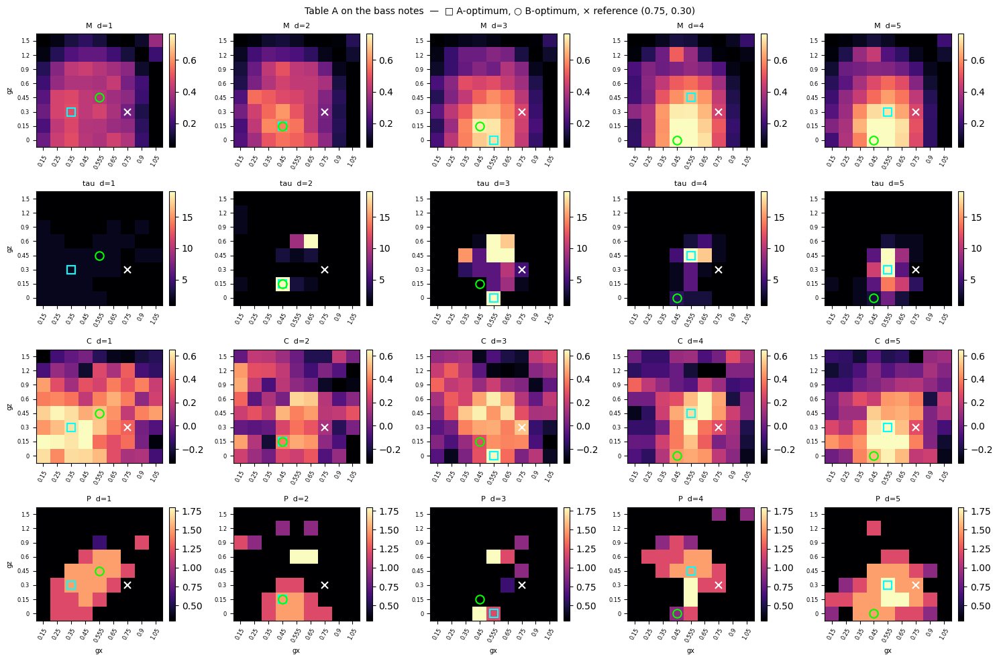

 d     gx    gz |     M  tau     C    P
 1  0.350  0.30 |  0.49    2  0.60  1.5
 2  0.450  0.15 |  0.58   25  0.40  1.5
 3  0.555  0.00 |  0.72   19  0.66  1.2
 4  0.555  0.45 |  0.66   19  0.59  1.5
 5  0.555  0.30 |  0.73   25  0.65  1.8


In [3]:
heat_row(['M', 'tau', 'C', 'P'], 'bass', 'Table A on the bass notes')
print(f"{'d':>2} {'gx':>6} {'gz':>5} | {'M':>5} {'tau':>4} {'C':>5} {'P':>4}")
for d in DELAYS:
    s = sel[str(d)]['old']; print(f"{d:>2} {s['gx']:6.3f} {s['gz']:5.2f} | {s['M']:5.2f} {s['tau']:4.0f} {s['C']:5.2f} {s['P']:4.1f}")


## 3. Table B — the proposed metrics (bass notes, then vibrato)

`E` echo fraction of the impulse response (exact one-excitation model), `G` impulse gain (exact), `Gm` measured
level, `tau_int` integrated phase memory $1+2\sum_{\ell\ge1}C(\ell)$, `R` envelope roughness, `D` sideband
distortion around the fundamentals (bass only), `T` tail after each note (bass only).
Rule: geometric mean over the two inputs of $E\cdot\tau_{\rm int}\cdot\sqrt{G_m}/(1+D/0.05)$.


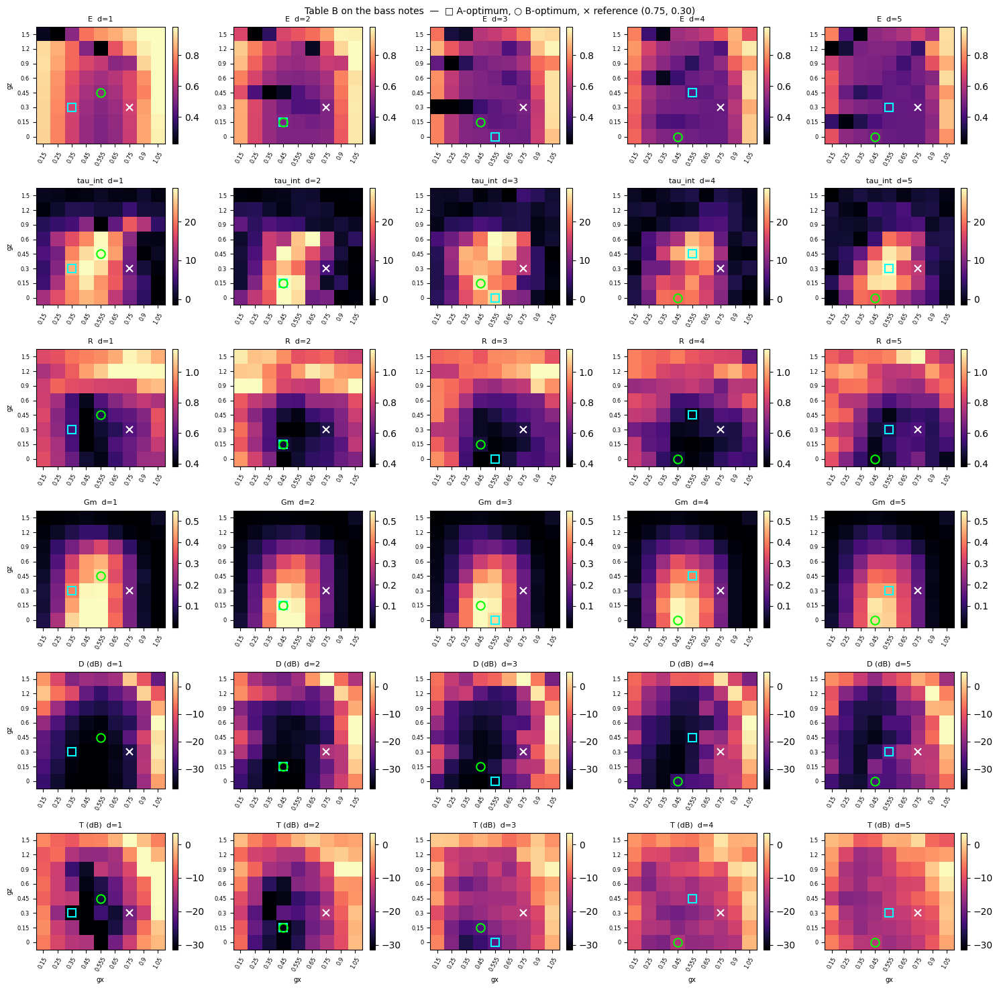

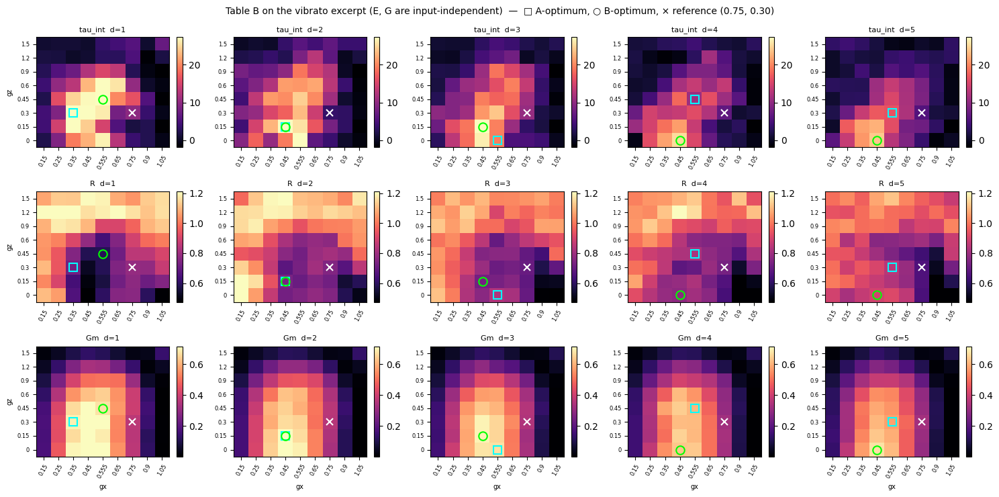

 d     gx    gz |     E tau_int     R    Gm   D dB   T dB | bass-only | vib-only
 1  0.555  0.45 |  0.54    29.4  0.49  0.50  -36.5  -27.7 | 0.450/0.30 | 0.555/0.45
 2  0.450  0.15 |  0.50    34.9  0.46  0.57  -37.6  -33.5 | 0.450/0.15 | 0.450/0.15
 3  0.450  0.15 |  0.47    27.4  0.47  0.58  -34.7  -22.2 | 0.450/0.15 | 0.450/0.15
 4  0.450  0.00 |  0.50    19.1  0.45  0.55  -29.1  -14.6 | 0.555/0.45 | 0.450/0.00
 5  0.450  0.00 |  0.48    18.5  0.42  0.51  -26.5  -13.9 | 0.555/0.30 | 0.450/0.00


In [4]:
heat_row(['E', 'tau_int', 'R', 'Gm', 'D', 'T'], 'bass', 'Table B on the bass notes', logs=('D', 'T'))
heat_row(['tau_int', 'R', 'Gm'], 'vib', 'Table B on the vibrato excerpt (E, G are input-independent)')
print(f"{'d':>2} {'gx':>6} {'gz':>5} | {'E':>5} {'tau_int':>7} {'R':>5} {'Gm':>5} {'D dB':>6} {'T dB':>6} | bass-only | vib-only")
for d in DELAYS:
    s = sel[str(d)]['new']; b = sel[str(d)]['new_bass_only']; v = sel[str(d)]['new_vib_only']
    print(f"{d:>2} {s['gx']:6.3f} {s['gz']:5.2f} | {s['E']:5.2f} {s['tau_int']:7.1f} {s['R']:5.2f} {s['Gm']:5.2f} {10*np.log10(max(s['D'],1e-9)):6.1f} {10*np.log10(max(s['T'],1e-9)):6.1f} | {b['gx']:5.3f}/{b['gz']:4.2f} | {v['gx']:5.3f}/{v['gz']:4.2f}")


## 4. Robustness across the two inputs, and how sharp the optimum is

In [5]:
from scipy.stats import spearmanr
print('Spearman rank correlation, bass-note score vs vibrato score over the 72 grid points:')
for d in DELAYS:
    b = A[(A[:, ix['delay']] == d) & (A[:, ix['input']] == 0)]; v = A[(A[:, ix['delay']] == d) & (A[:, ix['input']] == 1)]
    kb = {(round(r[ix['gx']],4), round(r[ix['gz']],4)): r for r in b}; kv = {(round(r[ix['gx']],4), round(r[ix['gz']],4)): r for r in v}
    sb = [kb[k][ix['E']]*kb[k][ix['tau_int']]*np.sqrt(max(kb[k][ix['Gm']],0))/(1+kb[k][ix['D']]/0.05) for k in kb]
    sv = [kv[k][ix['E']]*kv[k][ix['tau_int']]*np.sqrt(max(kv[k][ix['Gm']],0)) for k in kb]
    s = np.array(sb)
    print(f'  d={d}: rho = {spearmanr(sb, sv).correlation:.2f};   points within 20% / 50% of the best bass score: {np.mean(s >= 0.8*s.max())*100:3.0f}% / {np.mean(s >= 0.5*s.max())*100:3.0f}%')
print('\nmodule AUTO table (table B with gz floored at 0.15 so the resonator OSR*f/fs*gz stays active):')
print('  d=1: (0.555, 0.45)   d=2..5: (0.45, 0.15)')


Spearman rank correlation, bass-note score vs vibrato score over the 72 grid points:
  d=1: rho = 0.80;   points within 20% / 50% of the best bass score:  14% /  26%
  d=2: rho = 0.90;   points within 20% / 50% of the best bass score:   3% /  11%
  d=3: rho = 0.88;   points within 20% / 50% of the best bass score:   7% /  21%
  d=4: rho = 0.83;   points within 20% / 50% of the best bass score:   7% /  22%
  d=5: rho = 0.80;   points within 20% / 50% of the best bass score:   6% /  17%

module AUTO table (table B with gz floored at 0.15 so the resonator OSR*f/fs*gz stays active):
  d=1: (0.555, 0.45)   d=2..5: (0.45, 0.15)


## 5. Listen — bass notes, every delay: A-optimum, B-optimum, reference (every bin simulated, no tick removal)

  bass input (true peak 0.4999, playback normalised)


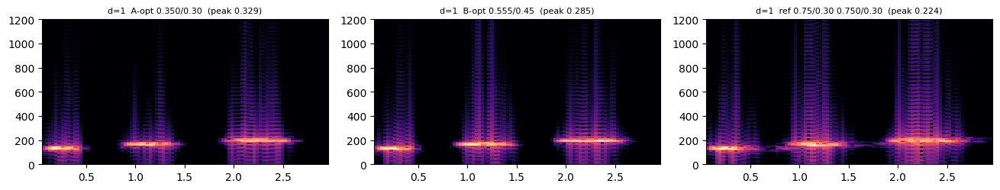

  d=1 A-opt 0.350/0.30 (true peak 0.3289, playback normalised)


  d=1 B-opt 0.555/0.45 (true peak 0.2849, playback normalised)


  d=1 ref 0.75/0.30 0.750/0.30 (true peak 0.2245, playback normalised)


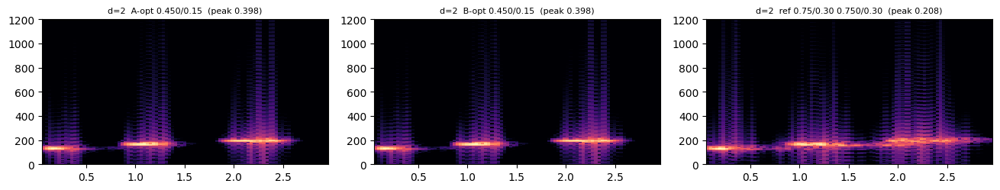

  d=2 A-opt 0.450/0.15 (true peak 0.3981, playback normalised)


  d=2 B-opt 0.450/0.15 (true peak 0.3981, playback normalised)


  d=2 ref 0.75/0.30 0.750/0.30 (true peak 0.2079, playback normalised)


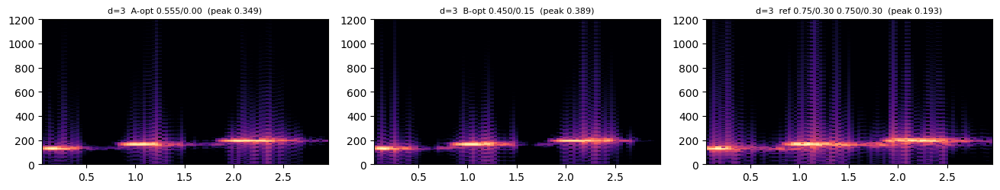

  d=3 A-opt 0.555/0.00 (true peak 0.3494, playback normalised)


  d=3 B-opt 0.450/0.15 (true peak 0.3893, playback normalised)


  d=3 ref 0.75/0.30 0.750/0.30 (true peak 0.1931, playback normalised)


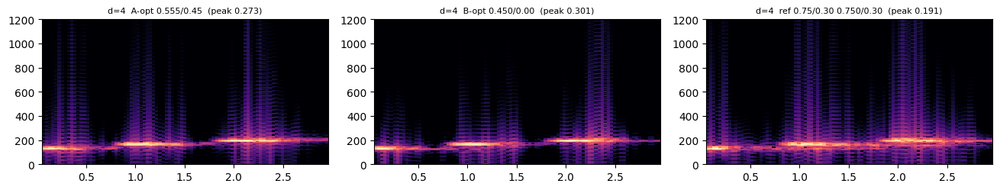

  d=4 A-opt 0.555/0.45 (true peak 0.2733, playback normalised)


  d=4 B-opt 0.450/0.00 (true peak 0.3009, playback normalised)


  d=4 ref 0.75/0.30 0.750/0.30 (true peak 0.1911, playback normalised)


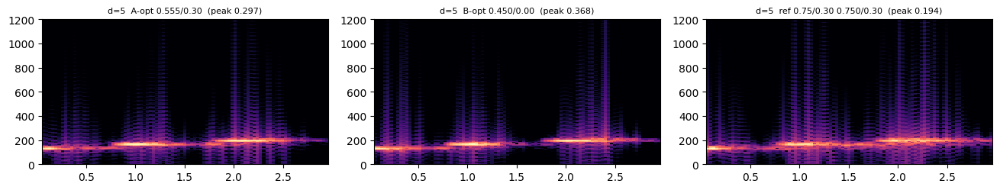

  d=5 A-opt 0.555/0.30 (true peak 0.2968, playback normalised)


  d=5 B-opt 0.450/0.00 (true peak 0.3680, playback normalised)


  d=5 ref 0.75/0.30 0.750/0.30 (true peak 0.1935, playback normalised)


In [6]:
x, _ = wav('bass_input.wav'); play(x, FS, 'bass input')
for d in DELAYS:
    ys = [(f"{TAG[tag]} {nm.split('_')[2][2:]}/{nm.split('_')[3][2:]}", wav(nm)[0]) for tag, nm in [(t, find('bass', d, t)) for t in ('old', 'new', 'ref')] if nm]
    spec_row(ys, 1200, f'd={d}')
    for lab, y in ys: play(y, FS, f'd={d} {lab}')


## 6. Listen — vibrato excerpt, every delay: B-optimum vs reference

  vibrato input (true peak 0.9961, playback normalised)


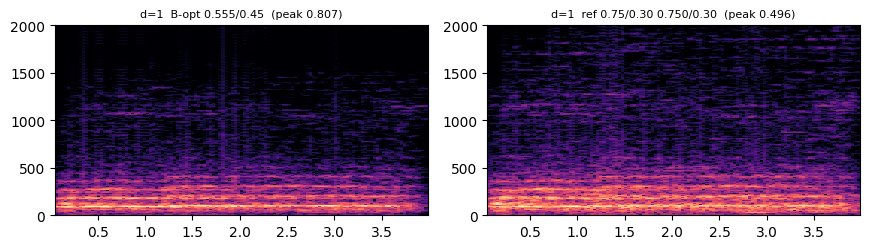

  d=1 B-opt 0.555/0.45 (true peak 0.8075, playback normalised)


  d=1 ref 0.75/0.30 0.750/0.30 (true peak 0.4960, playback normalised)


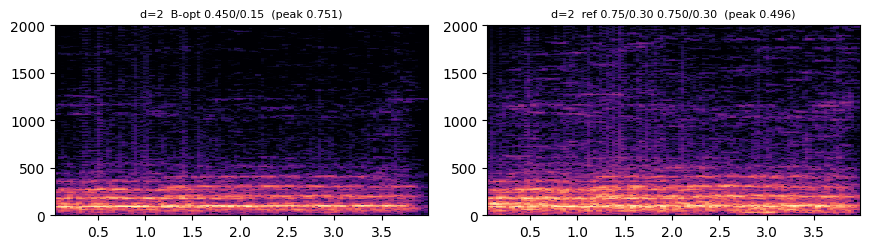

  d=2 B-opt 0.450/0.15 (true peak 0.7512, playback normalised)


  d=2 ref 0.75/0.30 0.750/0.30 (true peak 0.4963, playback normalised)


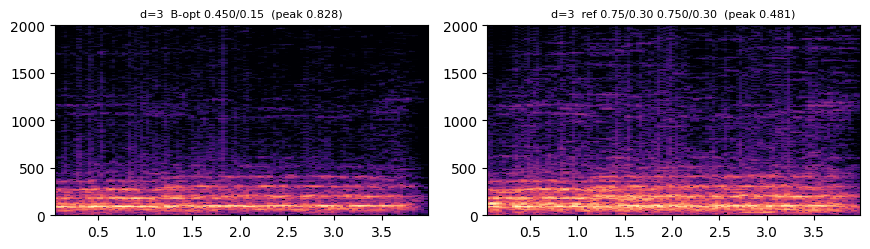

  d=3 B-opt 0.450/0.15 (true peak 0.8283, playback normalised)


  d=3 ref 0.75/0.30 0.750/0.30 (true peak 0.4808, playback normalised)


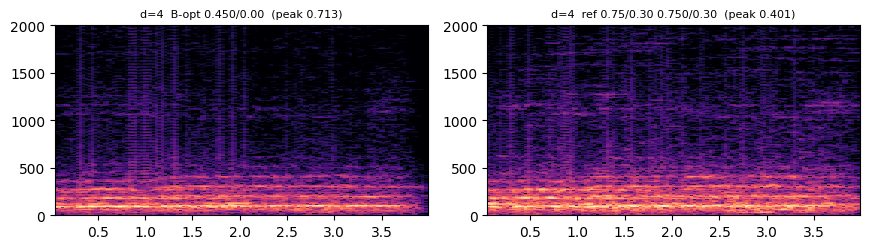

  d=4 B-opt 0.450/0.00 (true peak 0.7128, playback normalised)


  d=4 ref 0.75/0.30 0.750/0.30 (true peak 0.4006, playback normalised)


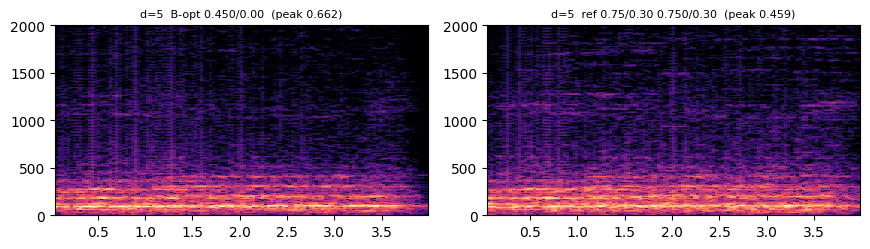

  d=5 B-opt 0.450/0.00 (true peak 0.6616, playback normalised)


  d=5 ref 0.75/0.30 0.750/0.30 (true peak 0.4595, playback normalised)


In [7]:
x, _ = wav('vib_input.wav'); play(x, FS, 'vibrato input')
for d in DELAYS:
    ys = [(f"{TAG[tag]} {nm.split('_')[2][2:]}/{nm.split('_')[3][2:]}", wav(nm)[0]) for tag, nm in [(t, find('vib', d, t)) for t in ('new', 'ref')] if nm]
    spec_row(ys, 2000, f'd={d}')
    for lab, y in ys: play(y, FS, f'd={d} {lab}')


## 7. The module's renders at the AUTO point (delay 3): undep, dep0, dep1, classical twin

dep0/dep1 keep at frame $n$ the trajectories whose measurement at $n+d$ gave 0 / 1; with one trajectory they
equal undep, so the module needs the TRAJECTORIES knob above 1 (here 4). The twin is the exact one-excitation
(linear) model of the same delay line driven by $\sqrt a\,e^{i\varphi}$ — the channel without qubit
saturation and without measurement back-action; it is labelled classical on the panel.


4 trajectories, 513 bins: 4 s


energy-weighted relative magnitude difference to undep:  cond0 0.11   cond1 0.14   twin 0.71
dep0 vs dep1: 0.24


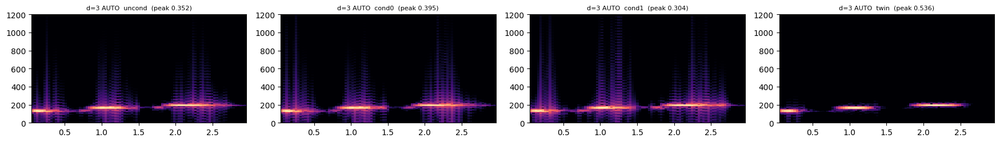

  uncond (true peak 0.3517, playback normalised)


  cond0 (true peak 0.3951, playback normalised)


  cond1 (true peak 0.3042, playback normalised)


  twin (true peak 0.5356, playback normalised)


In [8]:
import dsm_engine as eng
inp = sw.prepare_inputs()['bass']; im, ip, fb8 = inp['in_mag'], inp['in_phase'], inp['freq_bins']; bins = np.arange(im.shape[1])
kw = dict(gamma_x=0.45, gamma_z=0.15, measurement_basis='x', amp_pow=1.0, omega_s_res=23.0, fs=FS, carrier_clock=True, stft_hop=H, encode_target='system')
t0 = time.time(); st = ch._store(im, ip, fb8, bins, 3, np.pi, 4, 12345, kw, 8, 'numpy'); print(f'4 trajectories, 513 bins: {time.time()-t0:.0f} s')
Wb = im[:, inp['bins']]**2
rend = {}
for v in ('uncond', 'cond0', 'cond1'):
    m, ph = eng.render_from_store(st, v, 4, 3, 1.0, ip, bins); rend[v] = (m, ph)
tkw = {k: kw[k] for k in ('gamma_x', 'gamma_z', 'omega_s_res', 'fs', 'carrier_clock', 'stft_hop', 'encode_target', 'amp_pow')}
rend['twin'] = eng.twin(im, ip, fb8, bins, 3, np.pi, **tkw)
def rel(a, b): return np.sqrt((Wb*(a[:, inp['bins']]-b[:, inp['bins']])**2).sum()/(Wb*b[:, inp['bins']]**2).sum())
print('energy-weighted relative magnitude difference to undep:  ' + '   '.join(f'{v} {rel(rend[v][0], rend["uncond"][0]):.2f}' for v in ('cond0', 'cond1', 'twin')))
print(f'dep0 vs dep1: {rel(rend["cond0"][0], rend["cond1"][0]):.2f}')
ys = [(v, sw.istft(*rend[v])) for v in ('uncond', 'cond0', 'cond1', 'twin')]
spec_row(ys, 1200, 'd=3 AUTO')
for v, y in ys: play(y, FS, v)


## 8. Assessment

* **Both tables leave the reference.** $(0.75,0.30)$ is replaced by a valley $g_x\in[0.45,0.65]$, $g_z\in[0.15,0.45]$
  at every delay: twice the level, smoother envelope, longer memory, cleaner sidebands. Physics: with the encoding on
  the system qubit the first-tick split into the line is $\sin^2(2\sqrt2 g_x)/2$, maximal at $g_x=0.555$.
* **Table A is not a rule.** Its `tau` is 1 frame almost everywhere and saturates on isolated cells; $M\cdot\tau$ is
  decided by which cell saturated. The T17 metrics measure resemblance to coloured noise, nothing about the delay line.
* **Table B, caveats.** `E` alone rewards large $g_z$ where the channel is dead (roughness 1, level 0.05,
  sidebands 0 dB), hence the level, memory and `D` factors. $g_z=0$ switches the resonator off
  ($\Omega_{\rm res}\,f_k/f_s\,g_z$): more frame-rate streaks in the $d=5$ render, so the AUTO table floors $g_z$ at 0.15.
* **Robustness.** Rank correlation between inputs 0.80–0.90; identical optimum at $d=2,3$. The optimum is a valley,
  not a point, and single-trajectory metrics cannot rank cells inside it. Outside it the sound changes a lot.
* **Memory.** At the valley couplings the channel's impulse memory is hundreds of frames; the module's loop warm-up
  is derived from the exact impulse model per $(d, g_x, g_z)$ and capped at one loop period.
* **Bottom line.** Auto-association per delay is defensible for tonal material; the knobs stay because the valley
  edges are sharp, transients and broadband input were not swept, and $g_z$ audibly trades echo texture against
  sidebands. Judge by ear above.


In [9]:
print('bass-note renders: energy above 1 kHz / total (dB); input -89 dB')
for d in DELAYS:
    row = []
    for tag in ('old', 'new', 'ref'):
        nm = find('bass', d, tag)
        if nm is None: continue
        y, fs = wav(nm); Y = np.abs(np.fft.rfft(y))**2; fr = np.fft.rfftfreq(len(y), 1/fs)
        row.append(f"{TAG[tag]} {nm.split('_')[2][2:]}/{nm.split('_')[3][2:]}: {10*np.log10(Y[fr>1000].sum()/Y.sum()):6.1f} dB")
    print(f'  d={d}:  ' + '   '.join(row))


bass-note renders: energy above 1 kHz / total (dB); input -89 dB
  d=1:  A-opt 0.350/0.30:  -35.9 dB   B-opt 0.555/0.45:  -35.9 dB   ref 0.75/0.30 0.750/0.30:  -32.0 dB
  d=2:  A-opt 0.450/0.15:  -37.7 dB   B-opt 0.450/0.15:  -37.7 dB   ref 0.75/0.30 0.750/0.30:  -34.7 dB
  d=3:  A-opt 0.555/0.00:  -39.6 dB   B-opt 0.450/0.15:  -37.9 dB   ref 0.75/0.30 0.750/0.30:  -34.3 dB
  d=4:  A-opt 0.555/0.45:  -37.0 dB   B-opt 0.450/0.00:  -39.2 dB   ref 0.75/0.30 0.750/0.30:  -34.2 dB
  d=5:  A-opt 0.555/0.30:  -39.8 dB   B-opt 0.450/0.00:  -37.5 dB   ref 0.75/0.30 0.750/0.30:  -34.5 dB
